<a href="https://colab.research.google.com/github/Lanaanvar/Deep-Learning/blob/main/Set_1_and_Set_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Shape: (512, 512, 3)
Size: 786432
Data type: uint8
Compression Ratio: 19.475975173661062


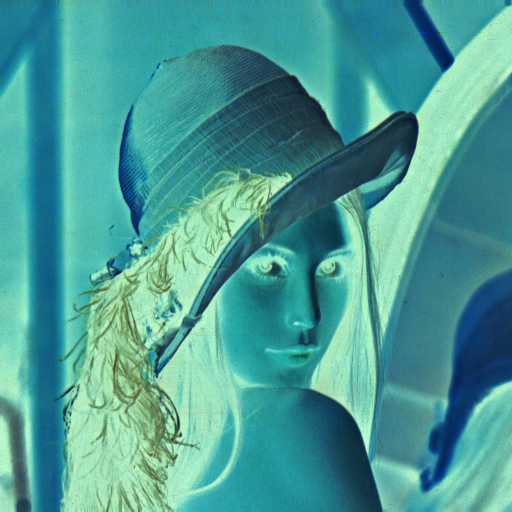

In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

# a. Read an image
img = cv2.imread('lena_img.png', cv2.IMREAD_COLOR)

# b. Get image information
print("Shape:", img.shape)
print("Size:", img.size)
print("Data type:", img.dtype)

# c. Compression ratio (original vs saved)
cv2.imwrite('compressed.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, 50])
original_size = os.path.getsize('lena_img.png')
compressed_size = os.path.getsize('compressed.jpg')
print("Compression Ratio:", original_size / compressed_size)

# d. Negative of an image
negative = 255 - img
cv2_imshow(negative)

/tmp/ipython-input-2972314831.py:4: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray.ravel(), 256, [0, 256])


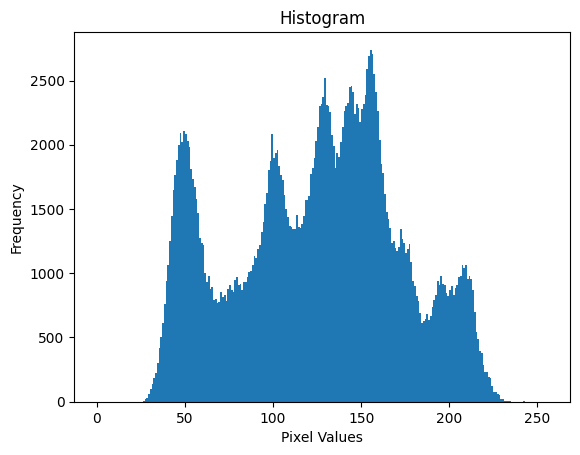

In [ ]:
import matplotlib.pyplot as plt

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.hist(gray.ravel(), 256, [0, 256])
plt.title('Histogram')
plt.xlabel('Pixel Values')
plt.ylabel('Frequency')
plt.show()


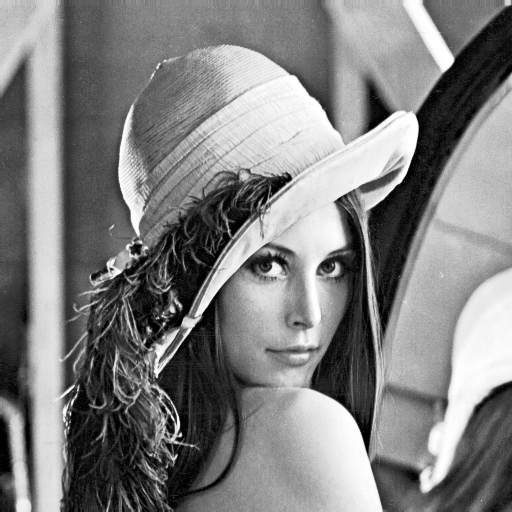

In [ ]:
equalized = cv2.equalizeHist(gray)
cv2_imshow(equalized)

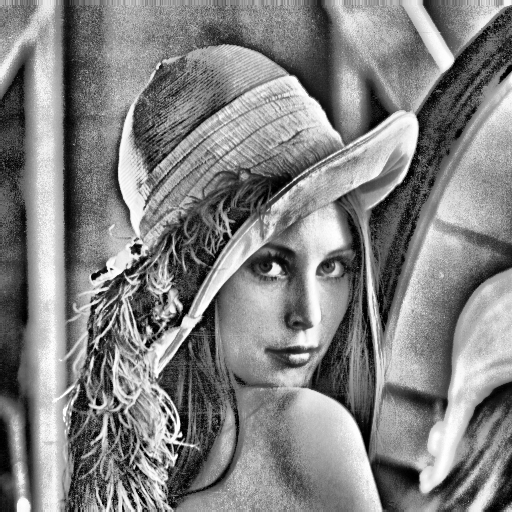

In [ ]:
from skimage import exposure
from google.colab.patches import cv2_imshow

local_eq = exposure.equalize_adapthist(gray/255, clip_limit=0.03)
cv2_imshow((local_eq * 255).astype('uint8'))

Displaying: Original


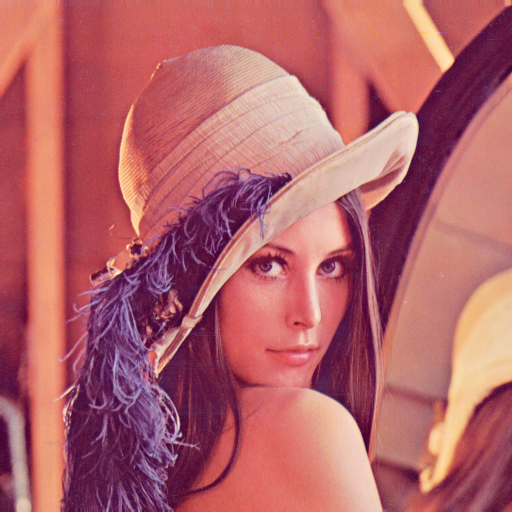

Displaying: Brightened


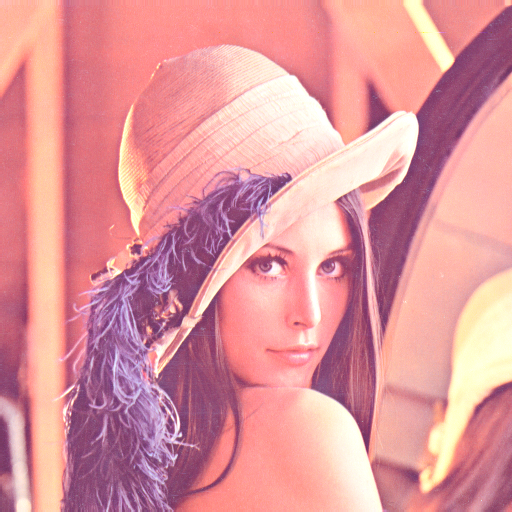

Displaying: Contrast Enhanced


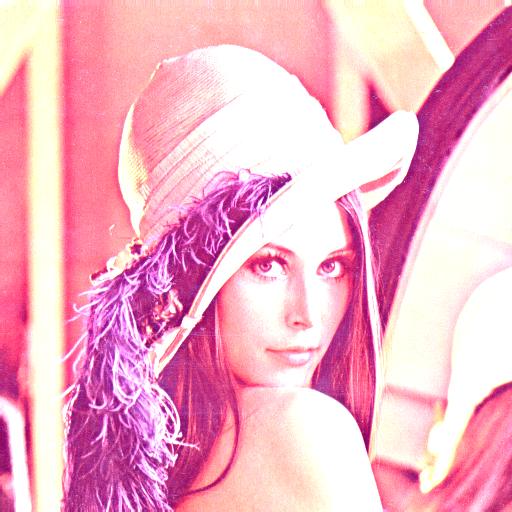

Displaying: Complement


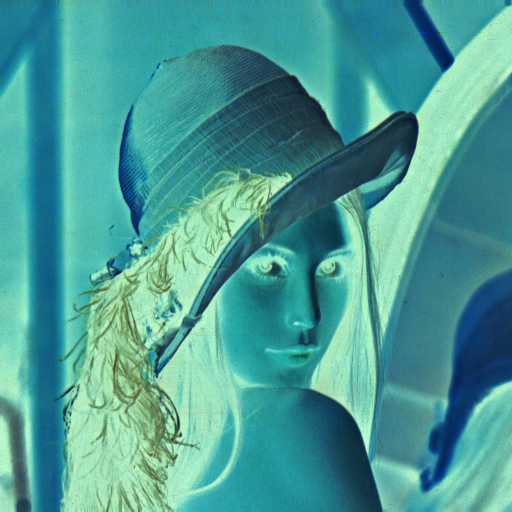

Displaying: Binary


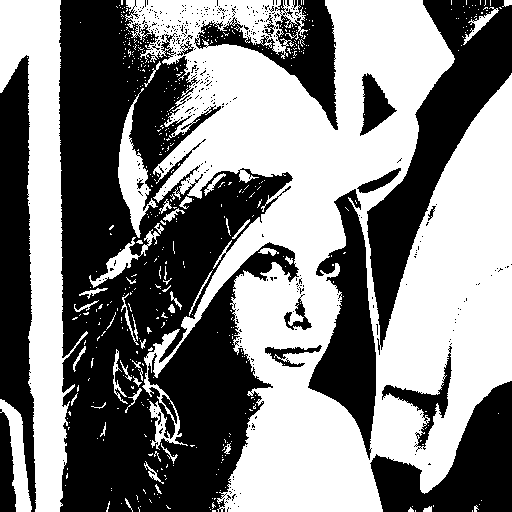

Displaying: Brightness Slicing


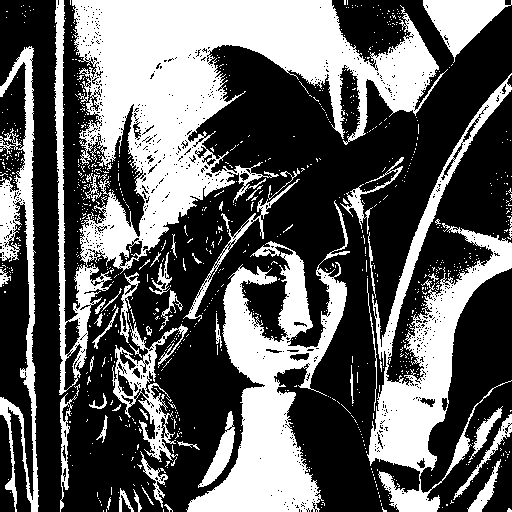

Displaying: Low-Pass


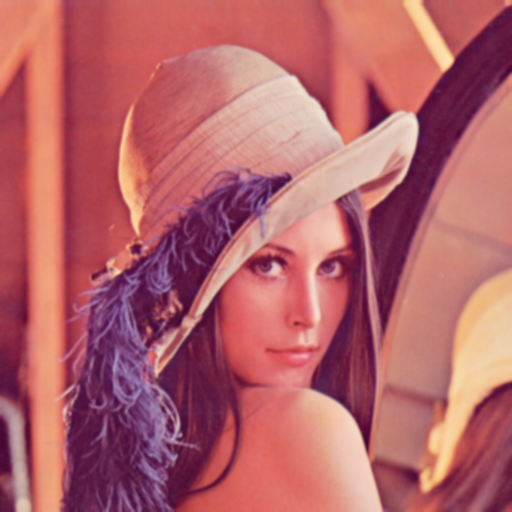

Displaying: High-Pass


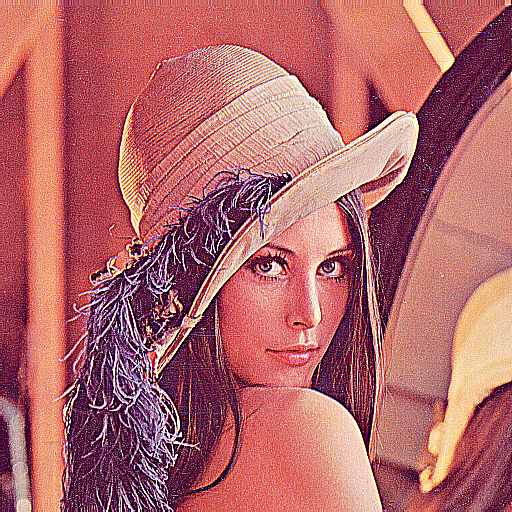

In [ ]:
# a. Brightness enhancement
bright = cv2.convertScaleAbs(img, alpha=1, beta=50)

# b. Contrast enhancement
contrast = cv2.convertScaleAbs(img, alpha=2, beta=0)

# c. Complement of an image
complement = cv2.bitwise_not(img)

# d. Bi-level contrast enhancement
_, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# e. Brightness slicing
brightness_slice = cv2.inRange(gray, 100, 150)

# f. Low-pass filtering (blurring)
low_pass = cv2.GaussianBlur(img, (5, 5), 0)

# g. High-pass filtering (sharpening)
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]])
high_pass = cv2.filter2D(img, -1, kernel)

# Show all
titles = ['Original', 'Brightened', 'Contrast Enhanced', 'Complement',
          'Binary', 'Brightness Slicing', 'Low-Pass', 'High-Pass']
images = [img, bright, contrast, complement, binary, brightness_slice, low_pass, high_pass]

for i in range(len(images)):
    print(f"Displaying: {titles[i]}")
    cv2_imshow(images[i])

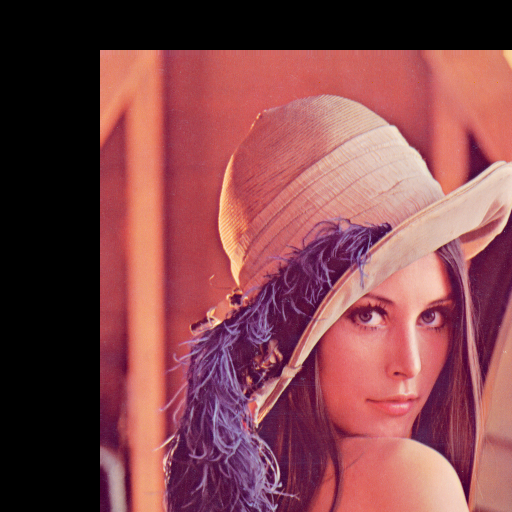

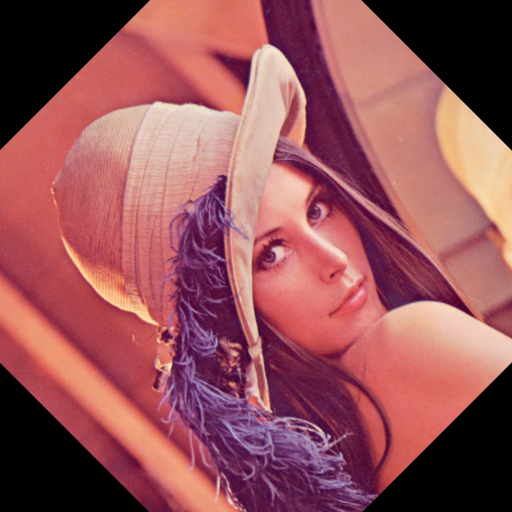

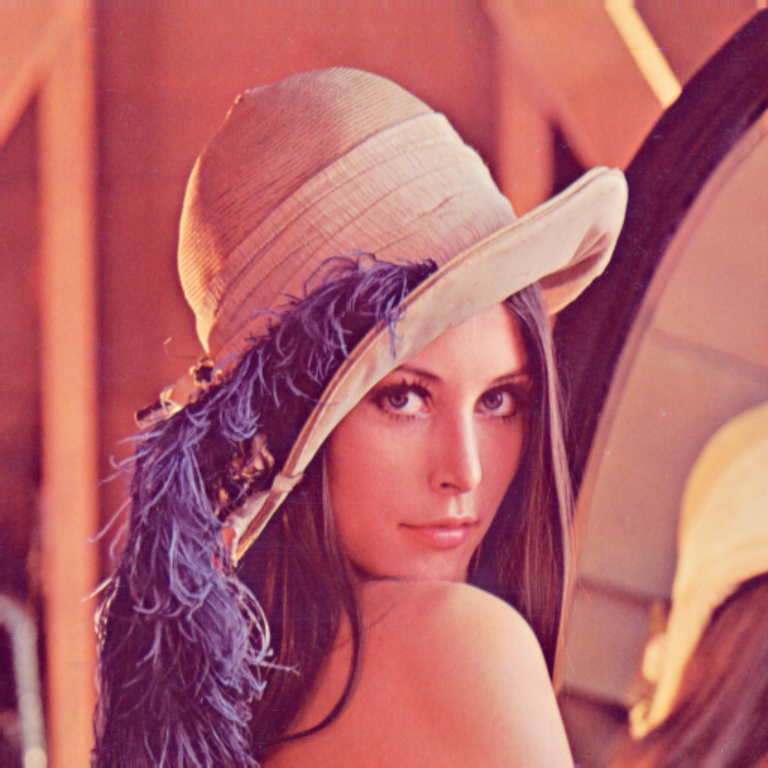

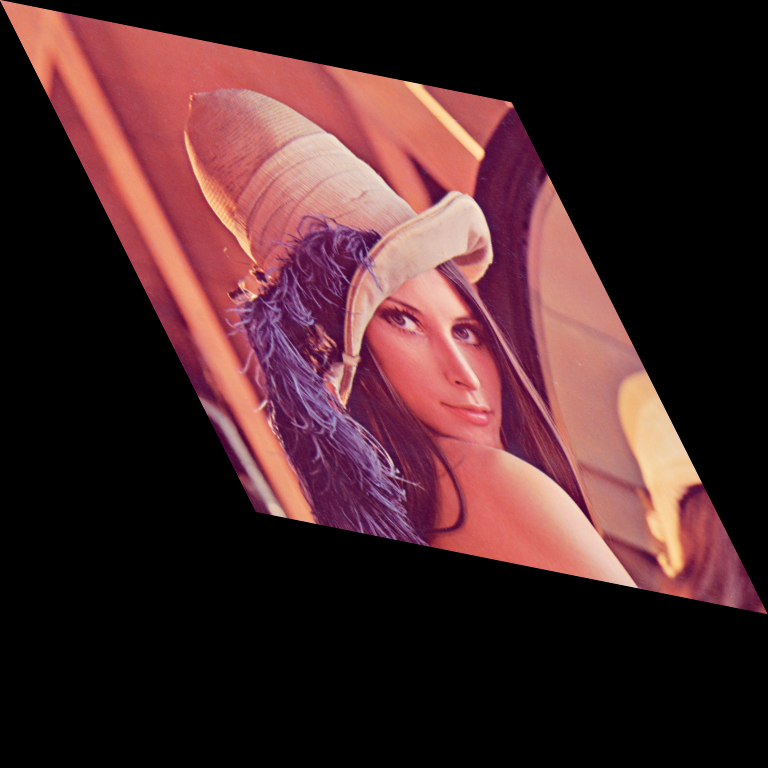

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

(h, w) = img.shape[:2]

# a. Translation
M = np.float32([[1, 0, 100], [0, 1, 50]])  # shift right 100, down 50
translated = cv2.warpAffine(img, M, (w, h))

# b. Rotation
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, 45, 1.0)
rotated = cv2.warpAffine(img, M, (w, h))

# c. Scaling
scaled = cv2.resize(img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR)

# d. Skewing
M = np.float32([[1, 0.5, 0], [0.2, 1, 0]])
skewed = cv2.warpAffine(img, M, (int(w*1.5), int(h*1.5)))

# Show transformations
cv2_imshow(translated)
cv2_imshow(rotated)
cv2_imshow(scaled)
cv2_imshow(skewed)
# cv2.waitKey(0) # Not needed with cv2_imshow
# cv2.destroyAllWindows() # Not needed with cv2_imshow

# **SET 2**

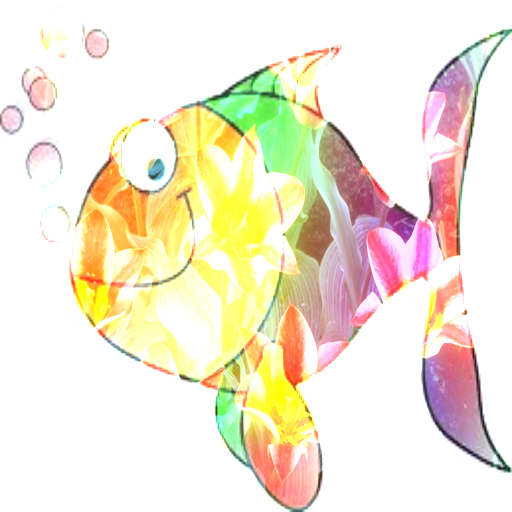

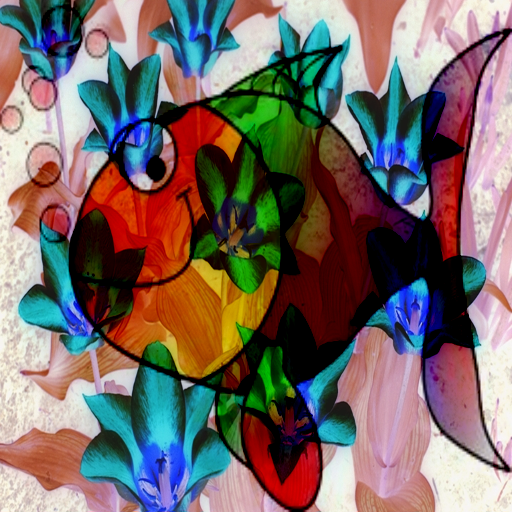

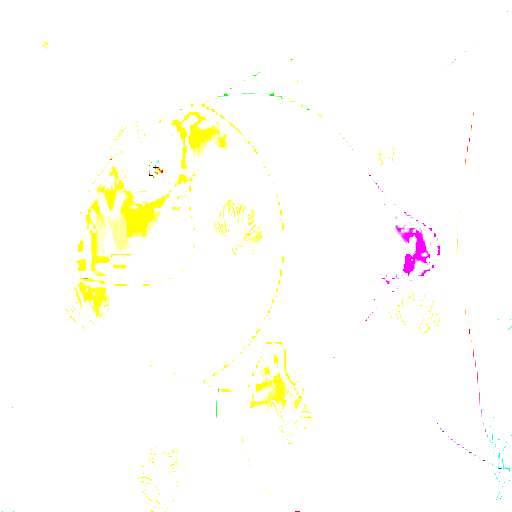

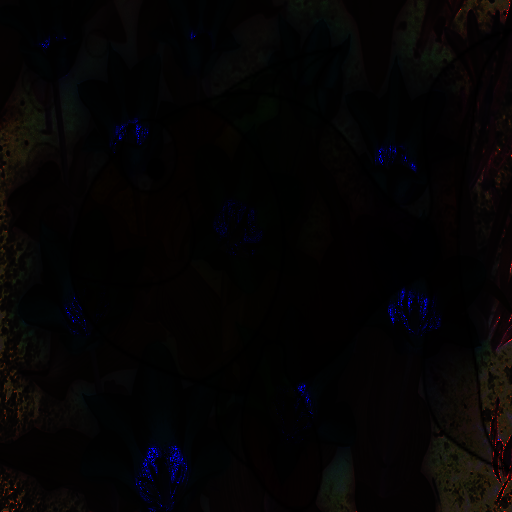

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

img1 = cv2.imread('image1.jpg')
img2 = cv2.imread('image2.png')

# Check if images were loaded successfully
if img1 is None:
    print("Error: image1.jpg not found or could not be loaded.")
elif img2 is None:
    print("Error: image2.jpg not found or could not be loaded.")
else:
    img1 = cv2.resize(img1, (512, 512))
    img2 = cv2.resize(img2, (512, 512))

    add = cv2.add(img1, img2)
    sub = cv2.subtract(img1, img2)
    mul = cv2.multiply(img1, img2)
    div = cv2.divide(img1, img2)

    # Use cv2_imshow instead of cv2.imshow
    cv2_imshow(add)
    cv2_imshow(sub)
    cv2_imshow(mul)
    cv2_imshow(div)
    # cv2.waitKey(0) # Not needed with cv2_imshow
    # cv2.destroyAllWindows() # Not needed with cv2_imshow

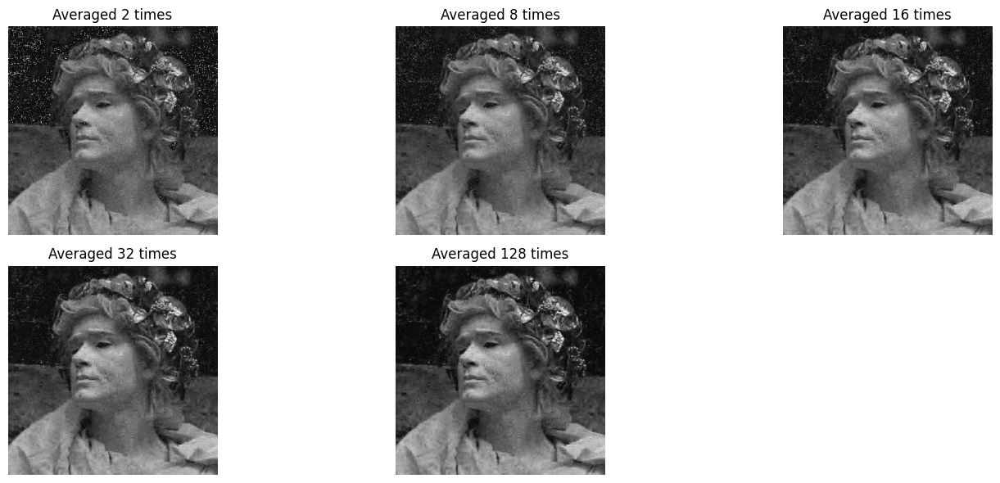

In [ ]:
import matplotlib.pyplot as plt

img = cv2.imread('noisy image.jpg', cv2.IMREAD_GRAYSCALE)

def average_reduction(image, n):
    avg_img = np.zeros_like(image, dtype=np.float32)
    for _ in range(n):
        noise = image + np.random.normal(0, 10, image.shape).astype('uint8')
        avg_img += noise
    return (avg_img / n).astype('uint8')

averages = [2, 8, 16, 32, 128]
results = [average_reduction(img, n) for n in averages]

plt.figure(figsize=(15, 6))
for i, n in enumerate(averages):
    plt.subplot(2, 3, i+1)
    plt.imshow(results[i], cmap='gray')
    plt.title(f"Averaged {n} times")
    plt.axis('off')
plt.tight_layout()
plt.show()


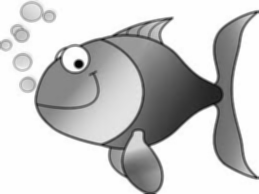

Displayed: Averaging


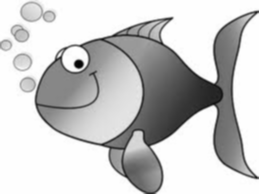

Displayed: Gaussian


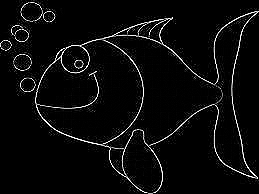

Displayed: Laplacian


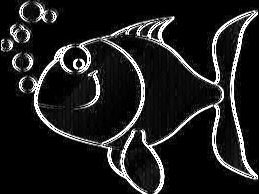

Displayed: Sobel X


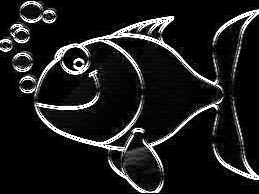

Displayed: Sobel Y


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

def apply_filter(img, kernel):
    return cv2.filter2D(img, -1, kernel)

img = cv2.imread('image1.jpg', 0)

# Example filters
kernels = {
    "Averaging": np.ones((3, 3), np.float32) / 9,
    "Gaussian": cv2.getGaussianKernel(3, 0) @ cv2.getGaussianKernel(3, 0).T,
    "Laplacian": np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]),
}

# Apply and display standard filters
for name, kernel in kernels.items():
    filtered = apply_filter(img, kernel)
    cv2_imshow(filtered)
    print(f"Displayed: {name}")

# Apply and display Sobel filters separately
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
abs_sobelx = cv2.convertScaleAbs(sobelx)
cv2_imshow(abs_sobelx)
print("Displayed: Sobel X")

sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
abs_sobely = cv2.convertScaleAbs(sobely)
cv2_imshow(abs_sobely)
print("Displayed: Sobel Y")

Applying 3x3 Averaging kernel:


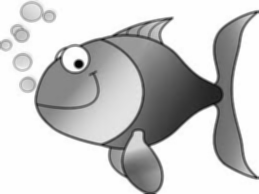

Displayed: Convolution with 3x3 Averaging


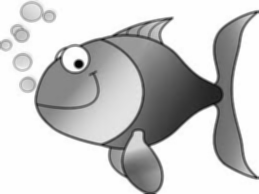

Displayed: Correlation with 3x3 Averaging
Applying 7x7 Averaging kernel:


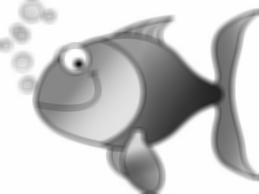

Displayed: Convolution with 7x7 Averaging


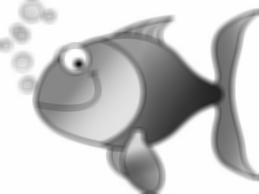

Displayed: Correlation with 7x7 Averaging
Applying 11x11 Averaging kernel:


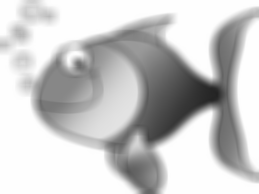

Displayed: Convolution with 11x11 Averaging


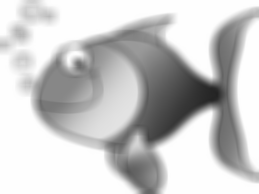

Displayed: Correlation with 11x11 Averaging


In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

def read_kernel(filepath):
    """Reads a convolution kernel from a text file."""
    with open(filepath, 'r') as f:
        lines = f.readlines()
        kernel = []
        for line in lines:
            kernel.append(list(map(float, line.split())))
    return np.array(kernel)

def convolve(image, kernel):
    """Performs convolution on an image with a given kernel."""
    # Flip the kernel for convolution
    kernel = np.flipud(np.fliplr(kernel))
    # Apply the filter
    return cv2.filter2D(image, -1, kernel)

def correlate(image, kernel):
    """Performs correlation on an image with a given kernel."""
    # Apply the filter directly
    return cv2.filter2D(image, -1, kernel)

# Create kernel.txt with example 3x3 averaging kernel
with open('kernel.txt', 'w') as f:
    f.write('0.111 0.111 0.111\n')
    f.write('0.111 0.111 0.111\n')
    f.write('0.111 0.111 0.111\n')

# Load an image (using image1.jpg as an example, assuming it exists)
img = cv2.imread('image1.jpg', 0) # Load as grayscale

if img is None:
    print("Error: image1.jpg not found or could not be loaded.")
else:
    # Test with different averaging kernels
    kernels = {
        "3x3 Averaging": np.ones((3, 3), np.float32) / 9,
        "7x7 Averaging": np.ones((7, 7), np.float32) / 49,
        "11x11 Averaging": np.ones((11, 11), np.float32) / 121,
    }

    for name, kernel in kernels.items():
        print(f"Applying {name} kernel:")

        # Convolution
        convolved_img = convolve(img, kernel)
        cv2_imshow(convolved_img)
        print(f"Displayed: Convolution with {name}")

        # Correlation
        correlated_img = correlate(img, kernel)
        cv2_imshow(correlated_img)
        print(f"Displayed: Correlation with {name}")

Noisy Image:


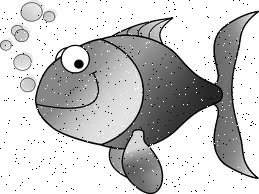

Median Filtered Image:


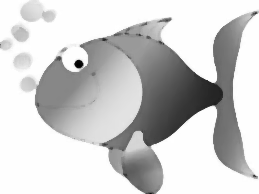

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def add_salt_pepper_noise(image, salt_vs_pepper, amount):
    """Adds salt and pepper noise to an image."""
    noisy_img = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * salt_vs_pepper)
    coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
    noisy_img[coords[0], coords[1]] = 255

    # Pepper mode
    num_pepper = np.ceil(amount * image.size * (1.0 - salt_vs_pepper))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
    noisy_img[coords[0], coords[1]] = 0
    return noisy_img

# Load an image (using image1.jpg as an example, assuming it exists)
img = cv2.imread('image1.jpg', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: image1.jpg not found or could not be loaded.")
else:
    # Add salt and pepper noise
    noisy_img = add_salt_pepper_noise(img, 0.5, 0.02)

    # Apply median filter
    median_filtered_img = cv2.medianBlur(noisy_img, 5) # Using a 5x5 kernel

    # Display original noisy image and filtered image
    print("Noisy Image:")
    cv2_imshow(noisy_img)
    print("Median Filtered Image:")
    cv2_imshow(median_filtered_img)

Sobel Edge Detection:


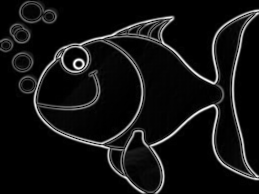

Prewitt Edge Detection:


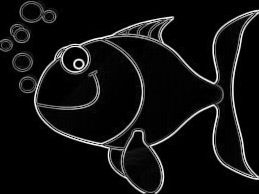

Roberts Edge Detection:


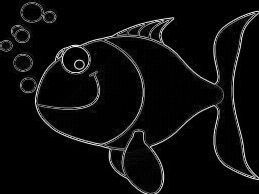

Laplacian of Gaussian (LOG) Edge Detection:


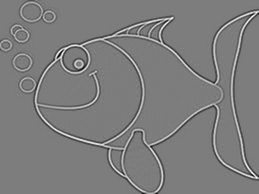

Canny Edge Detection:


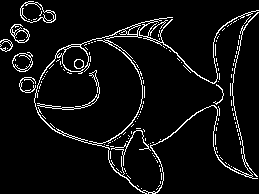

In [8]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from scipy import ndimage

# Load an image (using image1.jpg as an example, assuming it exists)
img = cv2.imread('image1.jpg', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: image1.jpg not found or could not be loaded.")
else:
    # a. Sobel
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    print("Sobel Edge Detection:")
    cv2_imshow(sobel)

    # b. Prewitt (manual implementation as it's not directly in OpenCV)
    kernelx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    kernely = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    prewittx = cv2.filter2D(img, cv2.CV_64F, kernelx)
    prewitty = cv2.filter2D(img, cv2.CV_64F, kernely)
    prewitt = np.sqrt(prewittx**2 + prewitty**2)

    min_val, max_val = np.min(prewitt), np.max(prewitt)
    if min_val == max_val:
        prewitt = np.zeros_like(prewitt, dtype='uint8')
    else:
        prewitt = cv2.normalize(prewitt, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    print("Prewitt Edge Detection:")
    cv2_imshow(prewitt)

    # c. Roberts (manual implementation)
    roberts_cross_x = np.array([[1, 0], [0, -1]])
    roberts_cross_y = np.array([[0, 1], [-1, 0]])
    robertsx = cv2.filter2D(img, cv2.CV_64F, roberts_cross_x)
    robertsy = cv2.filter2D(img, cv2.CV_64F, roberts_cross_y)
    roberts = np.sqrt(robertsx**2 + robertsy**2)

    min_val, max_val = np.min(roberts), np.max(roberts)
    if min_val == max_val:
        roberts = np.zeros_like(roberts, dtype='uint8')  # Black image if no edges
    else:
        roberts = cv2.normalize(roberts, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    print("Roberts Edge Detection:")
    cv2_imshow(roberts)

    # d. Laplacian of a Gaussian (LOG)
    # Gaussian blur
    blurred = cv2.GaussianBlur(img, (3, 3), 0)
    # Apply Laplacian
    log = cv2.Laplacian(blurred, cv2.CV_64F)
    log = cv2.normalize(log, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    print("Laplacian of Gaussian (LOG) Edge Detection:")
    cv2_imshow(log)


    # e. Canny
    canny = cv2.Canny(img, 100, 200)
    print("Canny Edge Detection:")
    cv2_imshow(canny)

Original RGB Image:


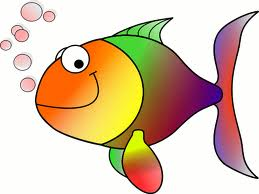

Smoothed RGB Image (Gaussian Blur):


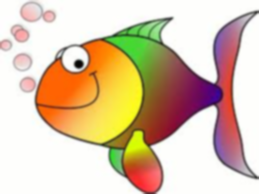

In [9]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load an RGB image (using image1.jpg as an example, assuming it exists)
# Make sure to load in color mode
img_color = cv2.imread('image1.jpg', cv2.IMREAD_COLOR)

if img_color is None:
    print("Error: image1.jpg not found or could not be loaded.")
else:
    # Apply a linear spatial filter (e.g., Gaussian blur)
    # Kernel size (5, 5) is an example, you can change it
    smoothed_img = cv2.GaussianBlur(img_color, (5, 5), 0)

    # Display the original and smoothed images
    print("Original RGB Image:")
    cv2_imshow(img_color)
    print("Smoothed RGB Image (Gaussian Blur):")
    cv2_imshow(smoothed_img)

Original RGB Image:


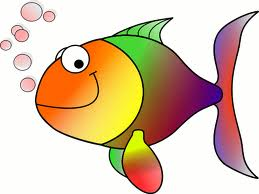

Sharpened RGB Image (Laplacian):


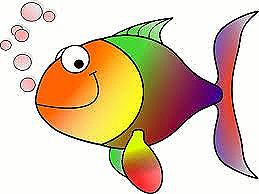

In [10]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load an RGB image (using image1.jpg as an example, assuming it exists)
img_color = cv2.imread('image1.jpg', cv2.IMREAD_COLOR)

if img_color is None:
    print("Error: image1.jpg not found or could not be loaded.")
else:
    # Convert to grayscale first for applying Laplacian
    gray_img = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

    # Apply Laplacian filter
    # Use CV_64F to handle potential negative values
    laplacian = cv2.Laplacian(gray_img, cv2.CV_64F)

    # Convert back to uint8 and scale for display
    # Absolute values are taken to make edges visible
    laplacian = cv2.convertScaleAbs(laplacian)

    # To sharpen the image, you can add the Laplacian result back to the original image.
    # Since the Laplacian was calculated on the grayscale image, we can add it to the grayscale image
    # and then potentially display it in color by converting back to BGR or by showing the sharpened grayscale.
    # Let's add it to the grayscale for simplicity in this example.
    sharpened_gray = cv2.addWeighted(gray_img, 1.0, laplacian, -0.5, 0) # Experiment with alpha and beta

    # Or, for a more standard sharpening, just use the Laplacian output as a high-pass filter result
    # and add it to the original image (this requires careful handling of channels for color images).
    # A common approach for color sharpening is to apply the sharpening to the V channel in HSV color space
    # or to each channel independently.

    # Let's apply the Laplacian to each channel of the color image and combine
    # This requires converting the image to a format that supports negative values temporarily (like float32)
    img_float32 = np.float32(img_color)
    sharpened_channels = []
    for i in range(3): # Iterate through B, G, R channels
        laplacian_channel = cv2.Laplacian(img_float32[:,:,i], cv2.CV_32F)
        # Sharpen by adding the Laplacian result back to the channel
        sharpened_channel = img_float32[:,:,i] - 0.5 * laplacian_channel # Adjust the weight (0.5) as needed
        # Clip values to the valid range [0, 255]
        sharpened_channel = np.clip(sharpened_channel, 0, 255)
        sharpened_channels.append(sharpened_channel.astype('uint8'))

    sharpened_color = cv2.merge(sharpened_channels)


    # Display the original and sharpened images
    print("Original RGB Image:")
    cv2_imshow(img_color)
    print("Sharpened RGB Image (Laplacian):")
    cv2_imshow(sharpened_color)

Original Image:


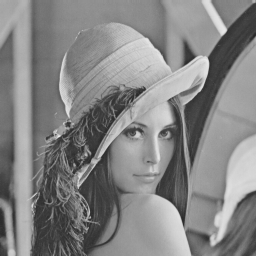

DFT Filtered Image (with Padding):


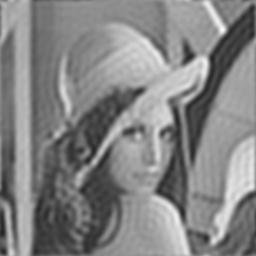

DFT Filtered Image (without Padding):


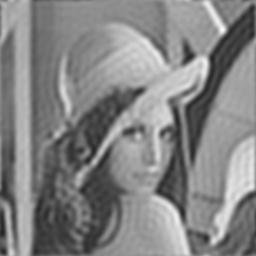

Difference between filtered images (absolute difference):


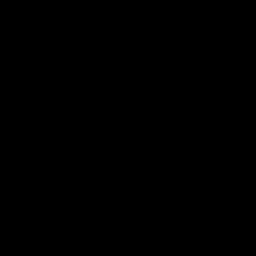

In [12]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Load a sample image (assuming 'lena_img.png' or 'image1.jpg' exists and resize it)
img = cv2.imread('lena_img.png', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found or could not be loaded.")
else:
    # Resize the image to 256x256
    img = cv2.resize(img, (256, 256))
    rows, cols = img.shape

    # Function to perform DFT filtering
    def dft_filter(image, filter_mask, use_padding=True):
        if use_padding:
            # Optimal padding size
            nrows = cv2.getOptimalDFTSize(rows)
            ncols = cv2.getOptimalDFTSize(cols)
            # Pad the image
            padded_img = cv2.copyMakeBorder(image, 0, nrows - rows, 0, ncols - cols, cv2.BORDER_CONSTANT, value=0)
        else:
            padded_img = image

        # Perform DFT
        dft = cv2.dft(np.float32(padded_img), flags=cv2.DFT_COMPLEX_OUTPUT)

        # Create a centered filter mask in the frequency domain
        # The filter mask should have the same size as the padded image DFT
        if use_padding:
             mask_rows, mask_cols = padded_img.shape
        else:
             mask_rows, mask_cols = image.shape


        # Create a simple low-pass filter mask (circular)
        center_row, center_col = mask_rows // 2, mask_cols // 2
        mask = np.zeros((mask_rows, mask_cols, 2), np.uint8)
        radius = 30 # Adjust radius for filtering strength
        cv2.circle(mask, (center_col, center_row), radius, (1, 1), -1)

        # Shift the zero-frequency component to the center
        dft_shift = np.fft.fftshift(dft)

        # Apply the filter mask
        fourier_filtered = dft_shift * mask

        # Shift back the zero-frequency component
        fourier_filtered_ishift = np.fft.ifftshift(fourier_filtered)

        # Perform inverse DFT
        img_back = cv2.idft(fourier_filtered_ishift, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

        if use_padding:
            # Crop the image back to original size
            img_back = img_back[0:rows, 0:cols]

        return img_back

    # Create a simple low-pass filter mask (circular) for both cases
    # This mask will be created inside the function based on padding
    # For comparison, let's define a consistent filter characteristic if possible,
    # but for simplicity, we'll use a consistent radius in the frequency domain.

    # Apply DFT filtering with padding
    filtered_with_padding = dft_filter(img, None, use_padding=True)

    # Apply DFT filtering without padding
    filtered_without_padding = dft_filter(img, None, use_padding=False)

    # Display the results
    print("Original Image:")
    cv2_imshow(img)

    print("DFT Filtered Image (with Padding):")
    cv2_imshow(filtered_with_padding)

    print("DFT Filtered Image (without Padding):")
    cv2_imshow(filtered_without_padding)

    # Compare the results (optional: e.g., calculate difference or PSNR)
    difference = cv2.absdiff(filtered_with_padding.astype('uint8'), filtered_without_padding.astype('uint8'))
    print("Difference between filtered images (absolute difference):")
    cv2_imshow(difference)

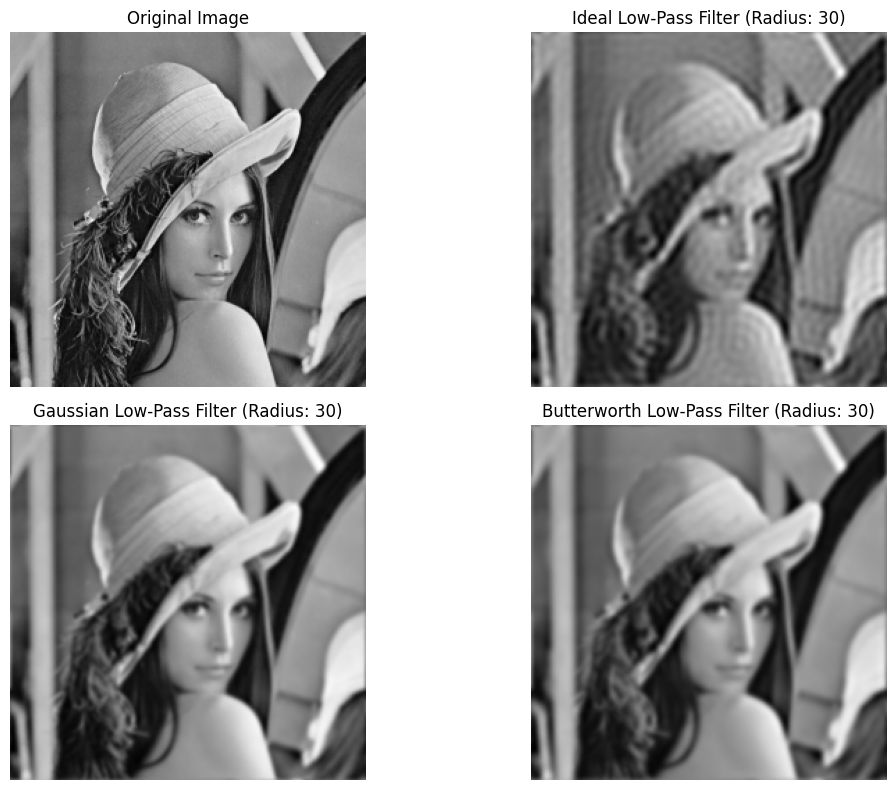

In [13]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Load a sample image (assuming 'lena_img.png' or 'image1.jpg' exists and resize it)
img = cv2.imread('lena_img.png', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found or could not be loaded.")
else:
    # Resize the image to 256x256 for consistency
    img = cv2.resize(img, (256, 256))
    rows, cols = img.shape

    # Perform DFT
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)

    # Shift the zero-frequency component to the center
    dft_shift = np.fft.fftshift(dft)

    # Function to create different low-pass filter masks
    def create_lowpass_filter(shape, filter_type, radius):
        rows, cols = shape
        center_row, center_col = rows // 2, cols // 2
        mask = np.zeros((rows, cols, 2), np.float32)

        if filter_type == 'ideal':
            for i in range(rows):
                for j in range(cols):
                    distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
                    if distance <= radius:
                        mask[i, j] = 1
        elif filter_type == 'gaussian':
            for i in range(rows):
                for j in range(cols):
                    distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
                    mask[i, j] = np.exp(-(distance**2) / (2 * radius**2))
        elif filter_type == 'butterworth':
            n = 2 # Order of the Butterworth filter
            for i in range(rows):
                for j in range(cols):
                    distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
                    mask[i, j] = 1 / (1 + (distance / radius)**(2 * n))

        return mask

    # Define filter parameters
    filter_radius = 30 # Adjust this value
    filter_types = ['ideal', 'gaussian', 'butterworth']

    # Apply and display different low-pass filters
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    for i, filter_type in enumerate(filter_types):
        # Create the filter mask
        lowpass_mask = create_lowpass_filter(dft_shift.shape[:2], filter_type, filter_radius)

        # Apply the filter mask
        fourier_filtered = dft_shift * lowpass_mask

        # Shift back for inverse DFT
        fourier_filtered_ishift = np.fft.ifftshift(fourier_filtered)

        # Perform inverse DFT
        img_back = cv2.idft(fourier_filtered_ishift, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

        # Display the filtered image
        plt.subplot(2, 2, i + 2)
        plt.imshow(img_back, cmap='gray')
        plt.title(f'{filter_type.capitalize()} Low-Pass Filter (Radius: {filter_radius})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

/tmp/ipython-input-3463019348.py:44: RuntimeWarning: divide by zero encountered in scalar divide
  mask[i, j] = 1 / (1 + (radius / distance)**(2 * n)) # Inverted for high-pass


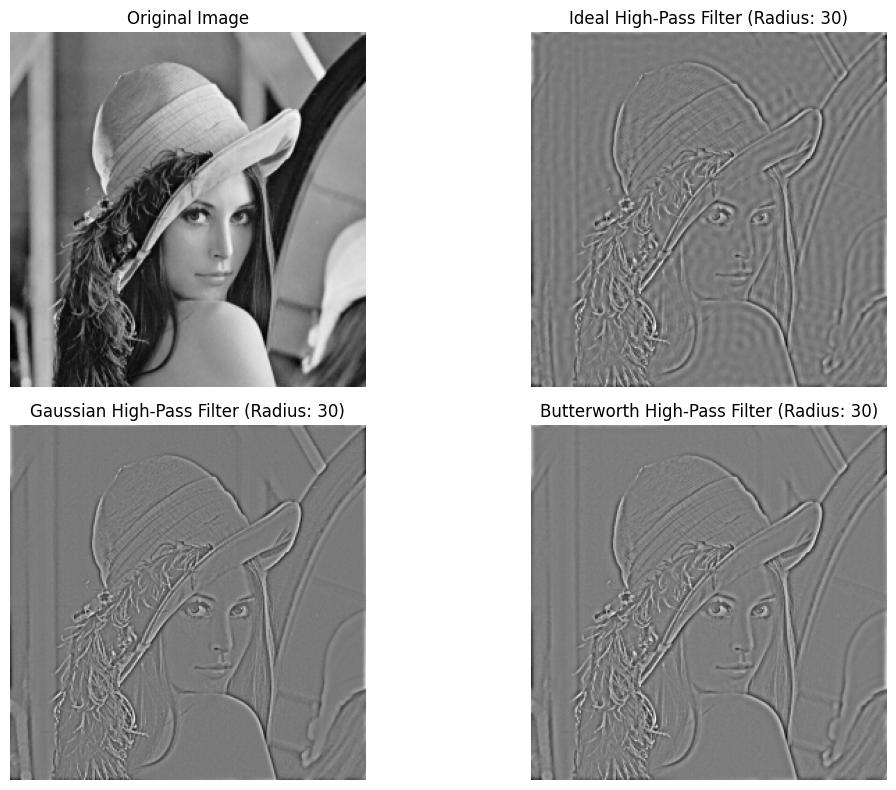

In [15]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Load a sample image (assuming 'lena_img.png' or 'image1.jpg' exists and resize it)
img = cv2.imread('lena_img.png', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found or could not be loaded.")
else:
    # Resize the image to 256x256 for consistency
    img = cv2.resize(img, (256, 256))
    rows, cols = img.shape

    # Perform DFT
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)

    # Shift the zero-frequency component to the center
    dft_shift = np.fft.fftshift(dft)

    # Function to create different high-pass filter masks
    def create_highpass_filter(shape, filter_type, radius):
        rows, cols = shape
        center_row, center_col = rows // 2, cols // 2
        mask = np.zeros((rows, cols, 2), np.float32)

        if filter_type == 'ideal':
            for i in range(rows):
                for j in range(cols):
                    distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
                    if distance > radius:
                        mask[i, j] = 1
        elif filter_type == 'gaussian':
            for i in range(rows):
                for j in range(cols):
                    distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
                    mask[i, j] = 1 - np.exp(-(distance**2) / (2 * radius**2))
        elif filter_type == 'butterworth':
            n = 2 # Order of the Butterworth filter
            for i in range(rows):
                for j in range(cols):
                    distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
                    mask[i, j] = 1 / (1 + (radius / distance)**(2 * n)) # Inverted for high-pass

        return mask

    # Define filter parameters
    filter_radius = 30 # Adjust this value
    filter_types = ['ideal', 'gaussian', 'butterworth']

    # Apply and display different high-pass filters
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    for i, filter_type in enumerate(filter_types):
        # Create the filter mask
        highpass_mask = create_highpass_filter(dft_shift.shape[:2], filter_type, filter_radius)

        # Apply the filter mask
        fourier_filtered = dft_shift * highpass_mask

        # Shift back for inverse DFT
        fourier_filtered_ishift = np.fft.ifftshift(fourier_filtered)

        # Perform inverse DFT
        img_back = cv2.idft(fourier_filtered_ishift, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

        # Display the filtered image
        plt.subplot(2, 2, i + 2)
        plt.imshow(img_back, cmap='gray')
        plt.title(f'{filter_type.capitalize()} High-Pass Filter (Radius: {filter_radius})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

Original Image:


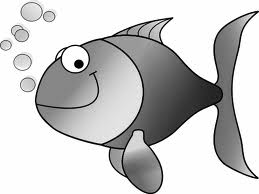

Horizontal Lines:


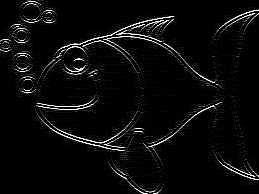

Vertical Lines:


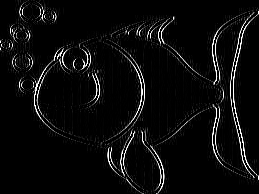

Diagonal (45 deg) Lines:


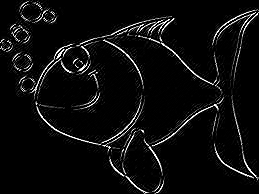

Diagonal (135 deg) Lines:


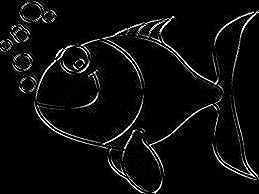

In [16]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load an image (using image1.jpg as an example, assuming it exists)
img = cv2.imread('image1.jpg', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: image1.jpg not found or could not be loaded.")
else:
    # Define line detection kernels
    horizontal_kernel = np.array([[-1, -1, -1],
                                  [ 2,  2,  2],
                                  [-1, -1, -1]])

    vertical_kernel = np.array([[-1, 2, -1],
                                [-1, 2, -1],
                                [-1, 2, -1]])

    diagonal_45_kernel = np.array([[-1, -1, 2],
                                   [-1, 2, -1],
                                   [ 2, -1, -1]])

    diagonal_135_kernel = np.array([[ 2, -1, -1],
                                    [-1, 2, -1],
                                    [-1, -1, 2]])

    # Apply the kernels
    horizontal_lines = cv2.filter2D(img, -1, horizontal_kernel)
    vertical_lines = cv2.filter2D(img, -1, vertical_kernel)
    diagonal_45_lines = cv2.filter2D(img, -1, diagonal_45_kernel)
    diagonal_135_lines = cv2.filter2D(img, -1, diagonal_135_kernel)

    # Display the results
    print("Original Image:")
    cv2_imshow(img)

    print("Horizontal Lines:")
    cv2_imshow(horizontal_lines)

    print("Vertical Lines:")
    cv2_imshow(vertical_lines)

    print("Diagonal (45 deg) Lines:")
    cv2_imshow(diagonal_45_lines)

    print("Diagonal (135 deg) Lines:")
    cv2_imshow(diagonal_135_lines)